In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.decomposition import PCA 
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler  
from sklearn.naive_bayes import GaussianNB ,MultinomialNB



In [3]:
df = pd.read_excel('Dry_Bean_Dataset.xlsx')

# Part a

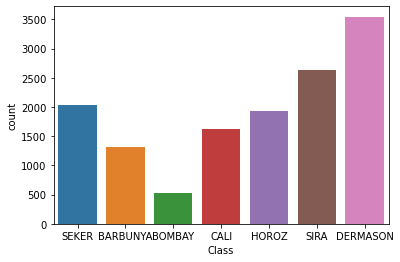

In [4]:
sns.countplot(x='Class', data=df, )
plt.show()


Analysis: <br>
    1) Major data entries are from DERMASON Class <br>
    2) Least number of data entries are from BOMBAY Class <br>
    3) A model Trained on this dataset will be more provide best predictions for DERMASON and,<br> 
       worst Predictions for BOMBAY Class According of LLN 

### Part b
Perform EDA (histograms, box plots, scatterplots, etc.) and give at least
five insights on the data. Check the missing values in the dataset.

In [5]:
#datafram shape and size
df.shape

(13611, 17)

In [6]:
#Column names
df.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

In [7]:
#data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

### Insight
No Null Values in dataset <br>
Number of entries in Dataset = 13611<br>
All the features are float except convex area

In [8]:
#Attirubute columns 
# ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength','AspectRation',
#  'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent','Solidity',
#  'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2','ShapeFactor3',
#  'ShapeFactor4']

In [9]:
#target column
# ['Class']

In [10]:
#Top 5 entries in the dataframe
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [11]:
#dataframe description
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


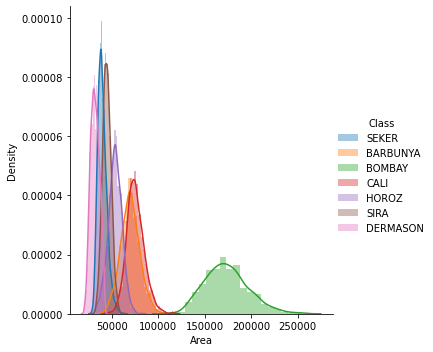

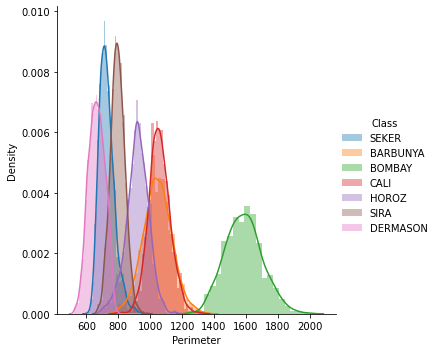

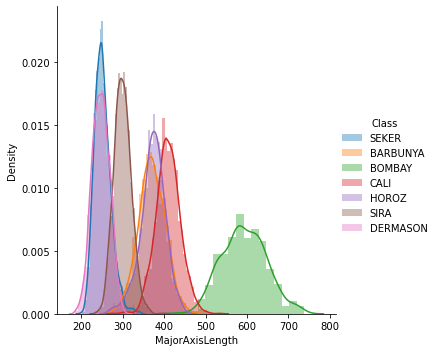

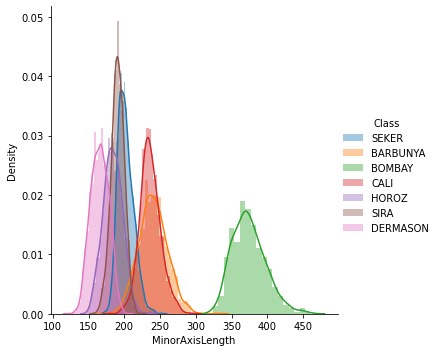

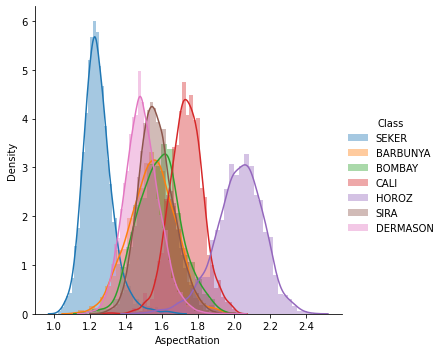

...

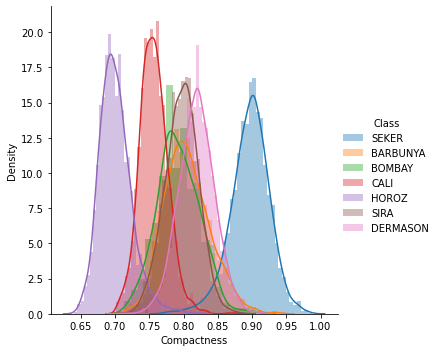

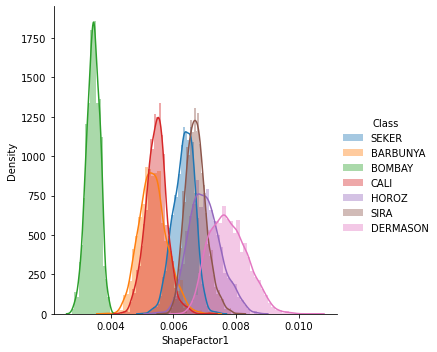

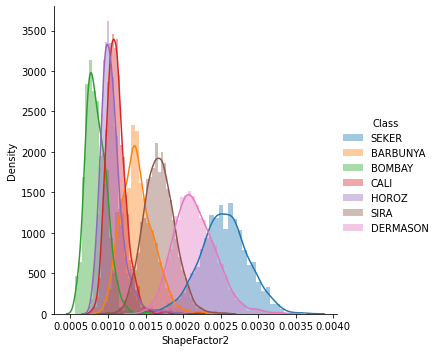

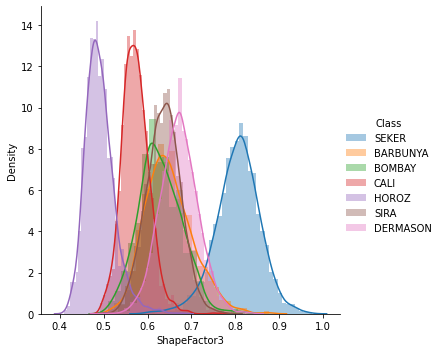

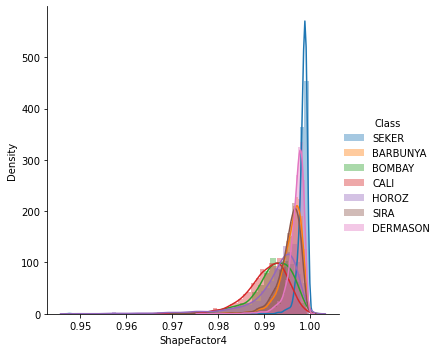

In [12]:
#Plotting the density curve for all the features of the dataset
for i in df.columns[:-1]:
    sns.FacetGrid(df, hue="Class", height=5).map(sns.distplot, i).add_legend()
#     sns.kdeplot(df[i],hue=df['Class'],fill=True,)
#     plt.show()

##### INSIGHTS
1. Beans from Bombay have higher area perimeter and major,minor axis length.<br>
2. The shape factor 2,3 4 are highest in 'SEKER' class.<br>
3. All the classes have comparable extent feature.

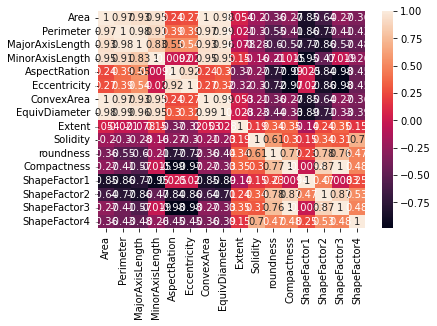

In [13]:
#correlation  heatmap to check for correlation
sns.heatmap(df.corr(method='pearson'),annot = True);
  
plt.show()

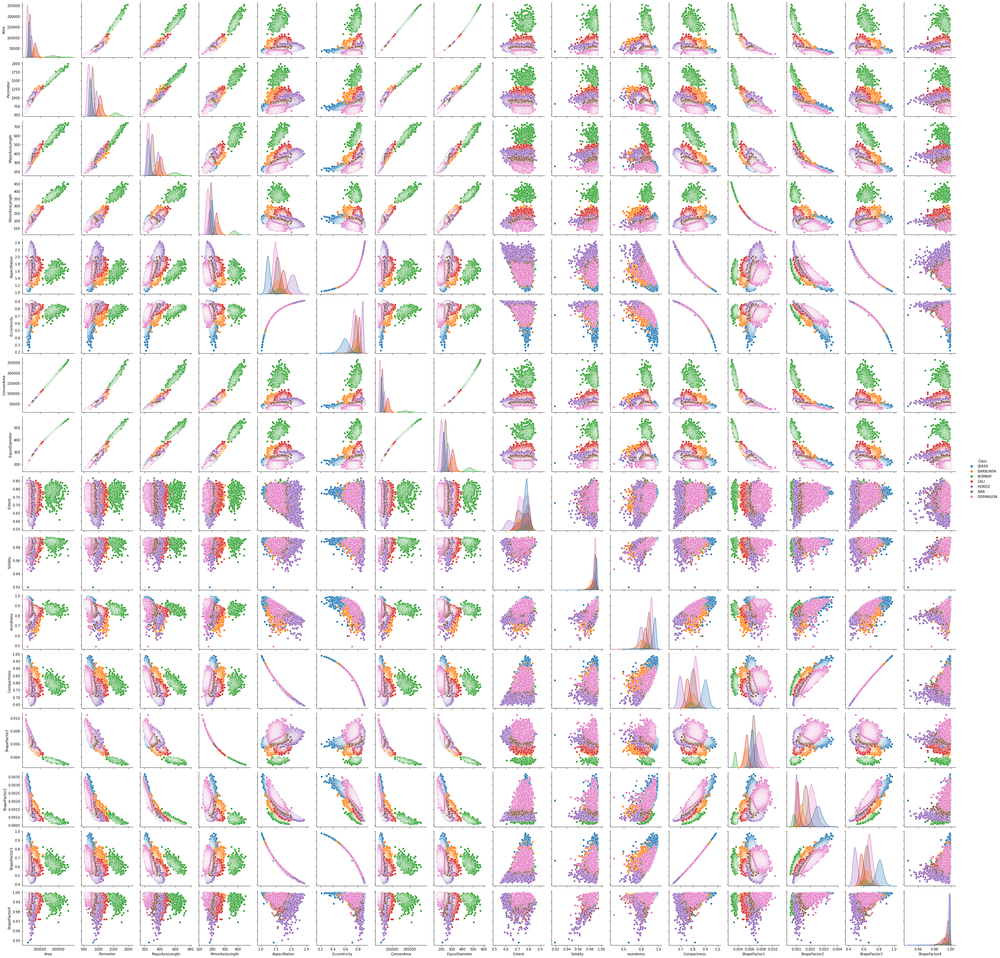

In [14]:
sns.pairplot(data=df,hue='Class')

#### Insights
1. Area feature is positively highly correlated with convexarea and equidiameter, <br> and negatively correlated with shapefactor 2 nd 3.
2. ShapeFactor 3 and compactness are positively correlated<br>
and other correlations are also there but not to the extremes

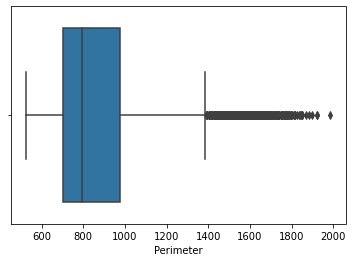

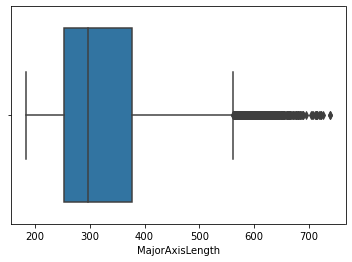

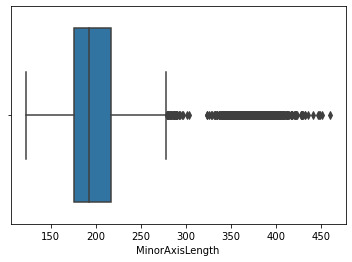

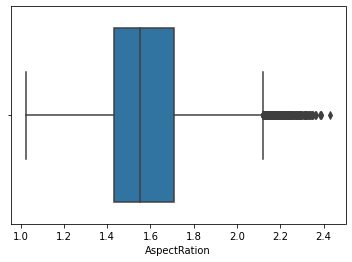

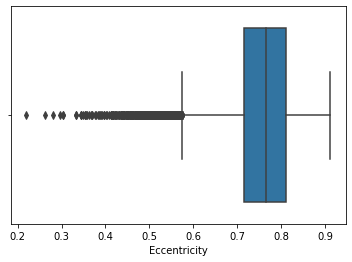

...

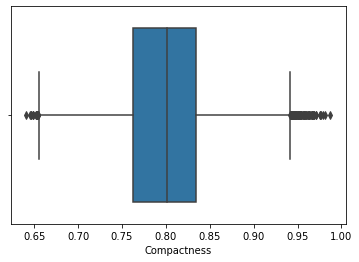

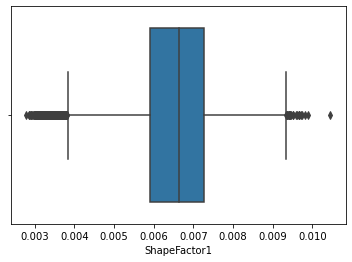

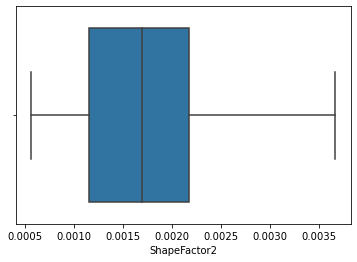

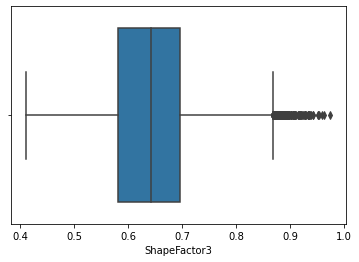

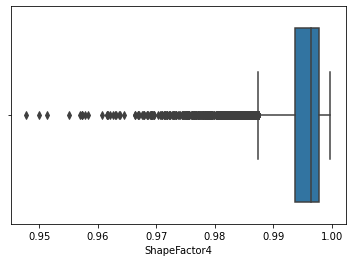

In [15]:
#box plots fot outlier finding
for i in df.columns[1:-1]:
    sns.boxplot(x=i, data=df)# outlier.add_legend()
    plt.show()


### Insights 
As we can see from the box plots there are a number of outliear in the distribution <br>
but these outliers can not be removed because removing them will delete a complete class from the distribution 

### Part c
Use TSNE (t-distributed stochastic neighbor embedding) algorithm to
reduce data dimensions to 2 and plot the resulting data as a scatter plot. Comment
on the separability of the data

In [16]:
##Performing standardization on data before TSNE

#target variable
tar_var=df["Class"]
#Attributes values
attr_var=df.drop("Class",axis=1)

# standardization of attribute variables
standarized_data = StandardScaler().fit_transform(attr_var)
print(standarized_data.shape)

(13611, 16)


In [17]:
#performing TSNE with 300 iterations
tsne_model = TSNE(n_components=2, random_state=0,perplexity=60, n_iter=300)
tsne_data = tsne_model.fit_transform(standarized_data)
print(tsne_data.shape)

(13611, 2)


In [18]:
#adding the target column to visualise the plots
tsne_1=np.vstack((tsne_data.T,tar_var)).T
tsne_1=pd.DataFrame(data=tsne_1,columns=("D_1","D_2","Class"))

<AxesSubplot:xlabel='D_1', ylabel='D_2'>

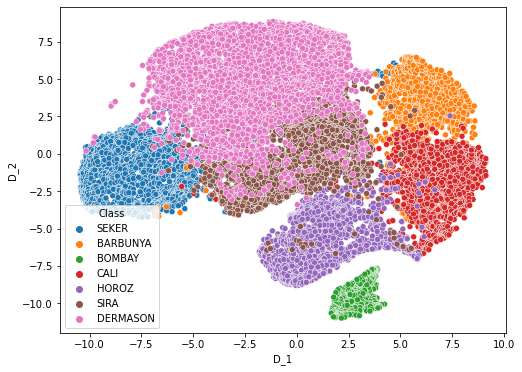

In [19]:
plt.figure(figsize=(8,6))
sns.scatterplot(x="D_1",y="D_2",hue="Class",data=tsne_1)

#### Comment on the Data Separablity 
Data is Separable it can be seen  in the above plot

### Part D
Run the sklearn’s implementation of Naive Bayes (Any 2 of your choice -
refer <a href="https://scikit-learn.org/stable/modules/naive_bayes.html">here</a>
). Report Accuracy, Recall, and Precision. Comment on the results and
their differences from the two implementations of Naive Bayes. (80:20 train test
split)


In [20]:
#encoding the class names to convert them to intergers

#creating labelEncoder
le = preprocessing.LabelEncoder()
# Converting string labels into numbers.
wheather_encoded=le.fit_transform(df["Class"])
df1=df
df1["Class"]=wheather_encoded

In [21]:

#target variable
tar_var=df1["Class"]
#Attributes values
attr_var=df1.drop("Class",axis=1)

In [22]:
#splitting the data into tranning and testing data with the 
#testing data size to be 20%

X_train, X_test, y_train, y_test= train_test_split(df1.drop("Class",axis=1),
                                                   df1["Class"], test_size=0.2,
                                                   random_state=18)

In [23]:
#Bayes
#Create a Gaussian Classifier
gnb = GaussianNB()

#Train the model using the training sets
gnb.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = gnb.predict(X_test)

In [24]:
# Model Accuracy
print("Gaussian Naive Bayes")
print("Accuracy: ",metrics.accuracy_score(y_test, y_pred))
print("Precision Score: ",metrics.precision_score(y_test, y_pred,average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_pred,average='micro'))

Gaussian Naive Bayes
Accuracy:  0.7627616599338964
Precision Score:  0.7627616599338964
Recall Score:  0.7627616599338964


In [25]:
#Bayes
#Create a Multinomial Classifier
mnb=MultinomialNB()

#Train the model using the training sets
mnb.fit(X_train, y_train)

#Predict the response for test dataset
y_predclf = mnb.predict(X_test)

In [26]:
print("Multinomial Naive Bayes")
print("Accuracy: ",metrics.accuracy_score(y_test, y_predclf))
print("Precision Score: ",metrics.precision_score(y_test, y_predclf,average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_predclf,average='micro'))

Multinomial Naive Bayes
Accuracy:  0.7847961806830701
Precision Score:  0.7847961806830701
Recall Score:  0.7847961806830701


### Comment on the results
Since Multinomial Classfier is best suited for discrete value prediction<br> 
and each features here can have a distribution type of it's  own<br>
while Gaussian is better for predicting continuous values we got better<br>
results by multinomial bayes

### Part E
Use Principal Component Analysis (PCA) to reduce the number of features and use the reduced data set for model training. Retain different amounts of
variance values, ranging from 0.9 to 1 in steps of 0.01. Compare results (Accuracy,
Precision, Recall, and F-1 score). (80:20 train test split)

In [27]:
##PCA function using Naive Bayes  
def PCA_f(dfx):
    x=dfx.drop('Class',axis=1)
    y=dfx['Class']

    #
    for i in range(4,13,2):
        
        #Using i/100 to decide the variance to be Kept
        #print(i/100)
        pca = PCA(n_components=i)
        pca.fit(x)
        data_pca = pca.transform(x)
        
        #naming the Columns PC+{i} 
        column=[]
        for j in range(1,len(data_pca[0])+1):
            column.append("PC"+str(j))
        data_pca = pd.DataFrame(data_pca, columns=column)
        
        
        #dividing PCA data into train and test
        X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(
            data_pca,df["Class"], test_size=0.2,random_state=18)
        
        #Gaussian Classifier
        gnb_pca=GaussianNB()
        gnb_pca.fit(X_train_pca, y_train_pca)
        
        #predicting the Values 
        y_pred=gnb_pca.predict(X_test_pca)
        
        #printing the results
        print()
        print("Gaussian Naive Bayes with PCA with {} Components".format(i))
        print("Accuracy: ",metrics.accuracy_score(y_test_pca, y_pred))
        print("Precision Score: ",metrics.precision_score(y_test_pca, y_pred,average='micro'))
        print("Recall Score: ",metrics.recall_score(y_test_pca, y_pred,average='micro'))
        print("F1 Score: ",metrics.f1_score(y_test_pca, y_pred,average='micro'))

In [28]:
# df2=df1
PCA_f(df1)
# print(df1)


Gaussian Naive Bayes with PCA with 4 Components
Accuracy:  0.8901946382666177
Precision Score:  0.8901946382666177
Recall Score:  0.8901946382666177
F1 Score:  0.8901946382666177

Gaussian Naive Bayes with PCA with 6 Components
Accuracy:  0.892398090341535
Precision Score:  0.892398090341535
Recall Score:  0.892398090341535
F1 Score:  0.892398090341535

Gaussian Naive Bayes with PCA with 8 Components
Accuracy:  0.892398090341535
Precision Score:  0.892398090341535
Recall Score:  0.892398090341535
F1 Score:  0.892398090341535

Gaussian Naive Bayes with PCA with 10 Components
Accuracy:  0.892398090341535
Precision Score:  0.892398090341535
Recall Score:  0.892398090341535
F1 Score:  0.892398090341535

Gaussian Naive Bayes with PCA with 12 Components
Accuracy:  0.892398090341535
Precision Score:  0.892398090341535
Recall Score:  0.892398090341535
F1 Score:  0.892398090341535


In [29]:
# import sys
# sys.setrecursionlimit(150)

### Part F
Use Scikit-learn to plot the ROC-AUC curves and comment on the out-
put.

In [30]:

mnb1=MultinomialNB()
#splitting the data into tranning and testing data with the 
#testing data size to be 20%

X_train, X_test, y_train, y_test= train_test_split(df.drop("Class",axis=1),
                                                   df["Class"], test_size=0.2,
                                                   random_state=18)

#tranning the model on tranning data
mnb1.fit(X_train,y_train)

MultinomialNB()

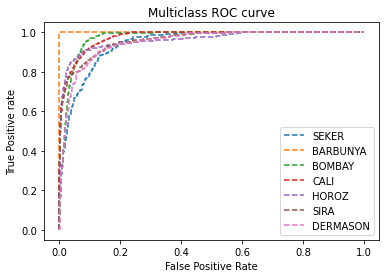

In [31]:
pred_prob = mnb1.predict_proba(X_test)

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}
auc={}

n_class = 7

for i in range(n_class):    
    fpr[i], tpr[i], _ = metrics.roc_curve(y_test, pred_prob[:,i], pos_label=i)




# plotting  

cl_names=['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON']
for i in range(7):
  plt.plot(fpr[i], tpr[i], linestyle='--',label=cl_names[i])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')

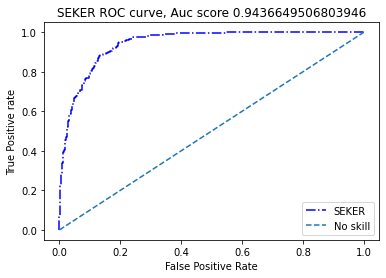

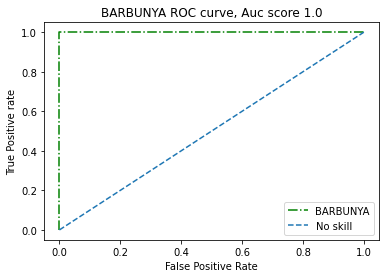

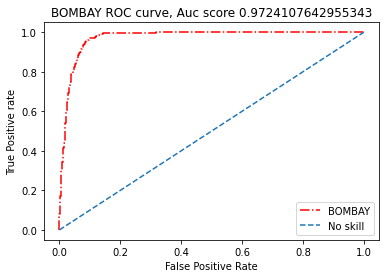

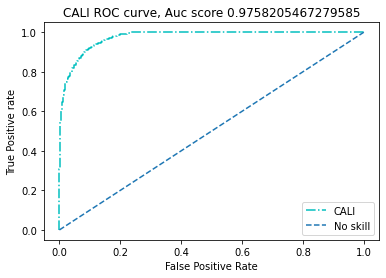

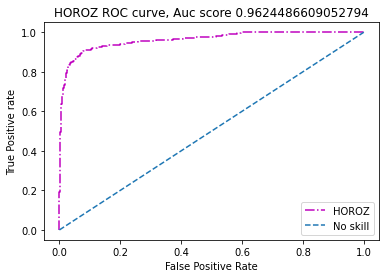

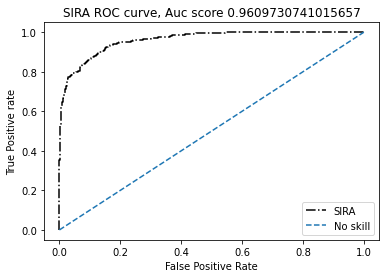

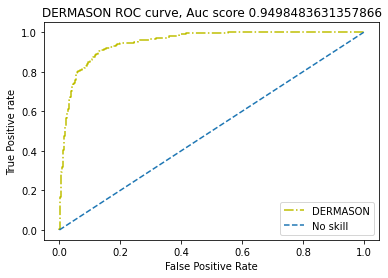

In [32]:
#Calculating the AUC score for every class
auc={}
for i in range(7):
  oc=[]
  for j in y_test:
    if i==j:
      oc.append(1)
    else:
      oc.append(0)
  auc[i]= metrics.roc_auc_score(oc, pred_prob[:,i])


colors=['b','g','r','c','m','k','y']
for i in range(7):
  plt.plot(fpr[i], tpr[i],color=colors[i], linestyle='-.',label=cl_names[i])

  plt.plot([0,1],[0,1],linestyle = "dashed" , label="No skill")

  plt.title(cl_names[i]+' ROC curve'+", Auc score "+str(auc[i]))
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive rate')
  plt.legend(loc='lower right')
  plt.show()

### Comment on the output
The ROC_AUC curves of the model after using Multinomial Naive bayes classifier:<br>
BARBUNYA >> CALI >> BOMBAY >> HOROZ >> SIRA >> DERMASON >> SEKER

In [33]:
lr=LogisticRegression(max_iter=200,multi_class='ovr')
X_train, X_test, y_train, y_test= train_test_split(df.drop("Class",axis=1),
                                                   df["Class"], test_size=0.2,
                                                   random_state=18)
lr.fit(X_train,y_train)
y_pr=lr.predict(X_test)
print("Logistic Regression ")
print("Accuracy: ",metrics.accuracy_score(y_test, y_pr))
print("Precision Score: ",metrics.precision_score(y_test, y_pr,average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_pr,average='micro'))

Logistic Regression 
Accuracy:  0.868160117517444
Precision Score:  0.868160117517444
Recall Score:  0.868160117517444


### SEC - C ENDS HERE

### Runnning TSNE for different preplexity for confirmation

(13611, 2)


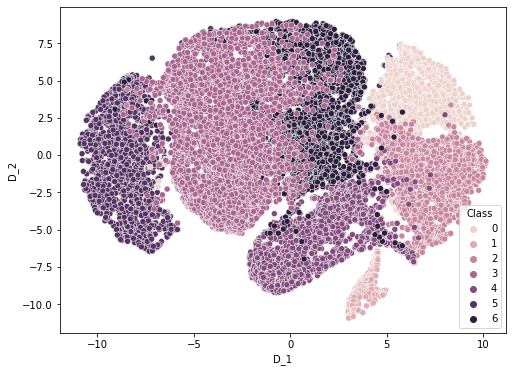

(13611, 2)


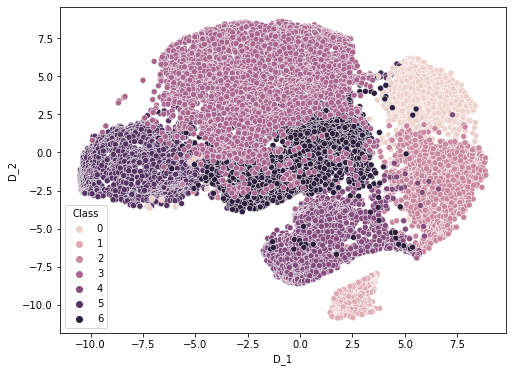

(13611, 2)


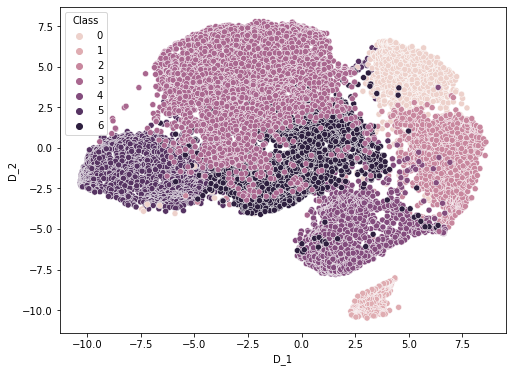

(13611, 2)


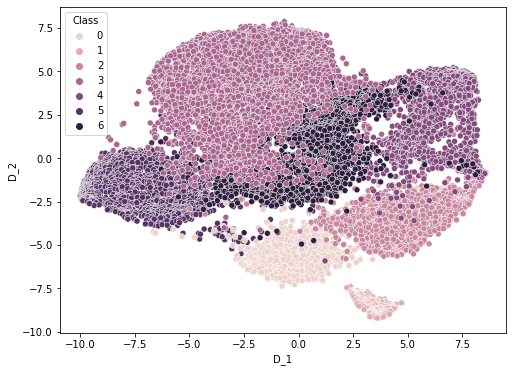

(13611, 2)


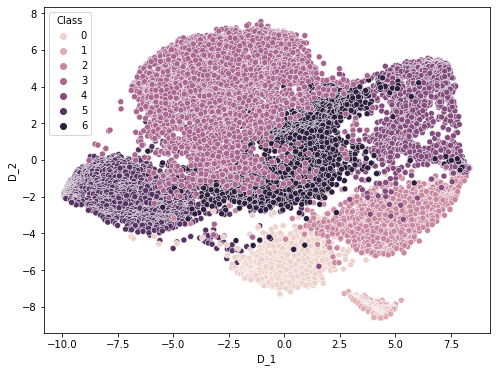

(13611, 2)


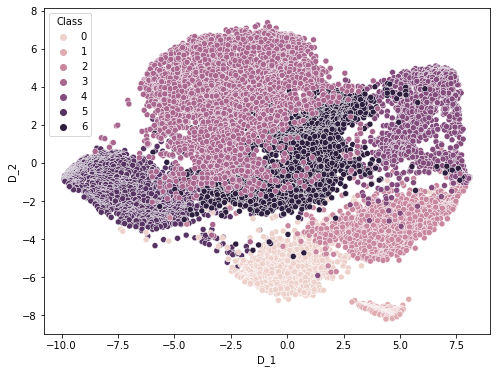

(13611, 2)


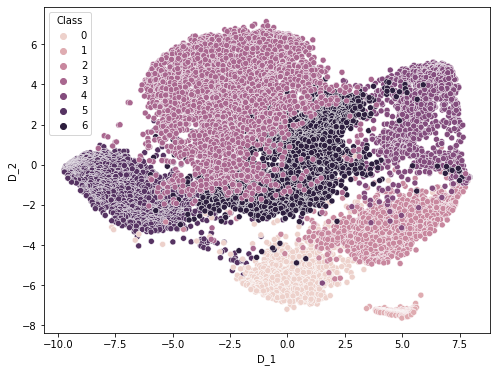

(13611, 2)


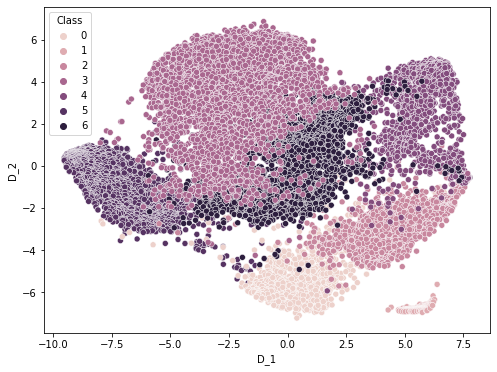

(13611, 2)


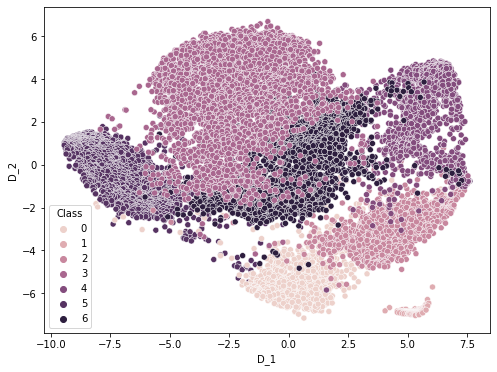

(13611, 2)


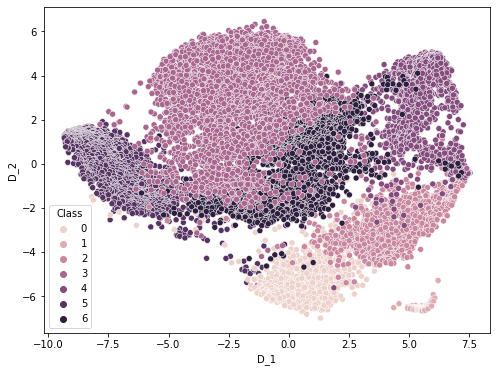

(13611, 2)


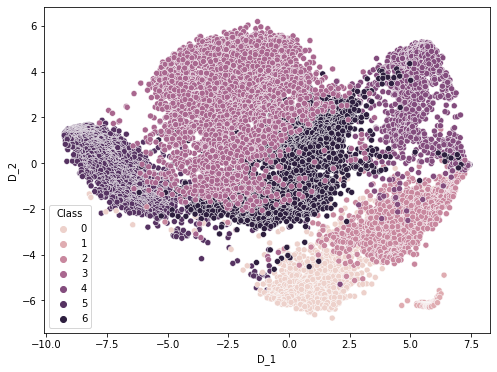

(13611, 2)


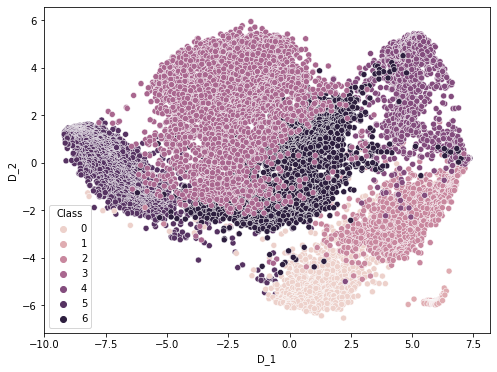

(13611, 2)


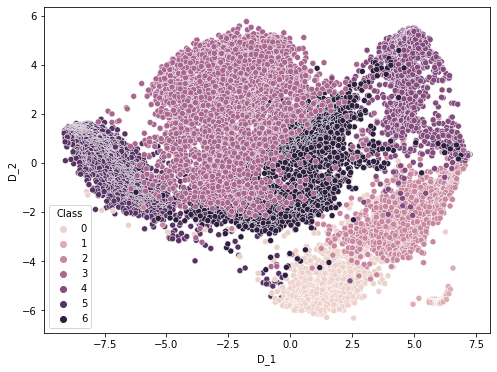

(13611, 2)


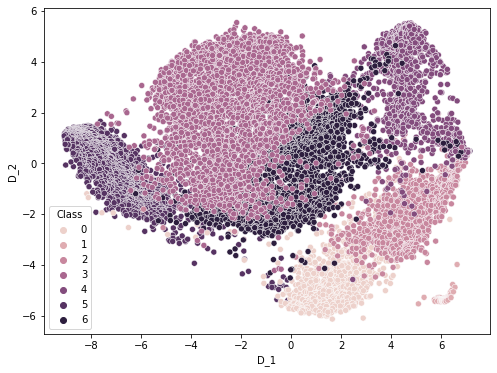

(13611, 2)


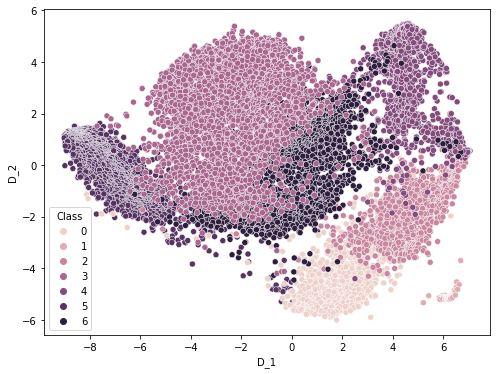

(13611, 2)


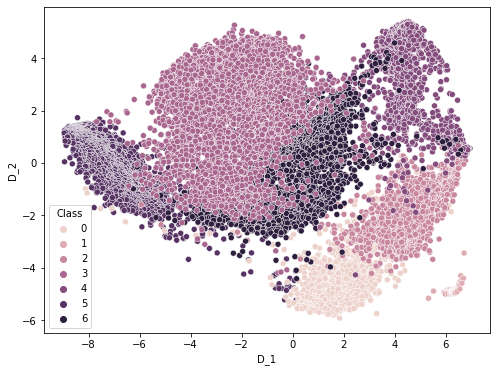

(13611, 2)


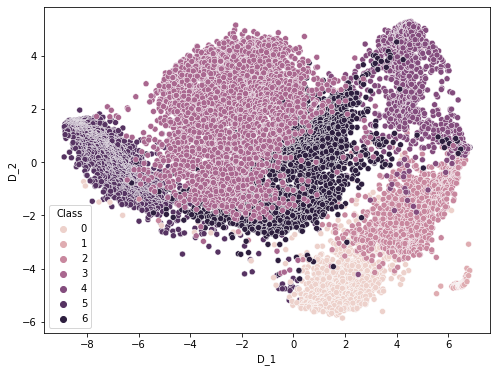

(13611, 2)


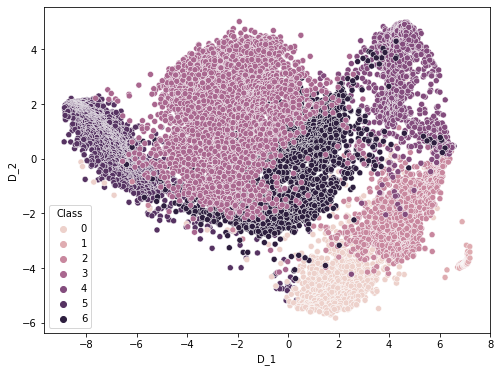

(13611, 2)


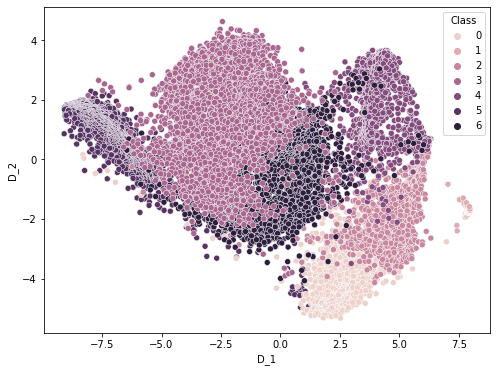

(13611, 2)


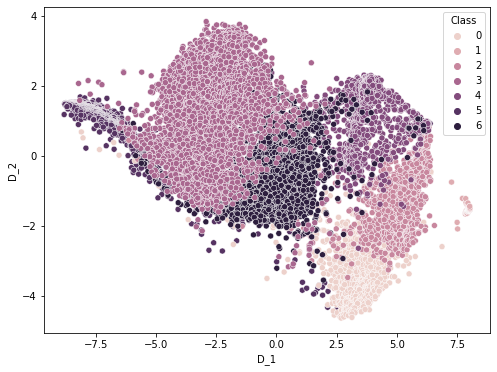

In [34]:
for m in range(30,1000,50):
    tsne_model = TSNE(n_components=2, random_state=0,perplexity=m, n_iter=300)
    tsne_data = tsne_model.fit_transform(standarized_data)
    print(tsne_data.shape)
    tsne_1=np.vstack((tsne_data.T,tar_var)).T
    tsne_1=pd.DataFrame(data=tsne_1,columns=("D_1","D_2","Class"))
    plt.figure(figsize=(8,6))
    sns.scatterplot(x="D_1",y="D_2",hue="Class",data=tsne_1)
    plt.show()

In [35]:
warnings.filterwarnings(action='once')